In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc, accuracy_score, precision_recall_curve
from imblearn.over_sampling import SMOTE
from sklearn.metrics import f1_score

In [2]:
df = pd.read_csv('data.csv')

## EDA

Initial Inspection of our data

In [3]:
# Check the first 5 rows of the data
df.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [4]:
# Check the last 5 rows of the data
df.tail()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,1,0.038284
6816,0,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,1,0.097649
6817,0,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,1,0.044009
6818,0,0.493053,0.570105,0.549548,0.627409,0.627409,0.998080,0.801987,0.813800,0.313415,...,0.815956,0.000707,0.626680,0.627408,0.841019,0.275114,0.026793,0.565167,1,0.233902


In [5]:
# Overview of the dataset dimensions
df.shape

(6819, 96)

In [6]:
# Check column names and data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

In [7]:
# Basic Statistics
df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


In [8]:
# Missing values check
df.isnull().sum()

,0
Bankrupt?,0
ROA(C) before interest and depreciation before interest,0
ROA(A) before interest and % after tax,0
ROA(B) before interest and depreciation after tax,0
Operating Gross Margin,0
...,...
Liability to Equity,0
Degree of Financial Leverage (DFL),0
Interest Coverage Ratio (Interest expense to EBIT),0
Net Income Flag,0


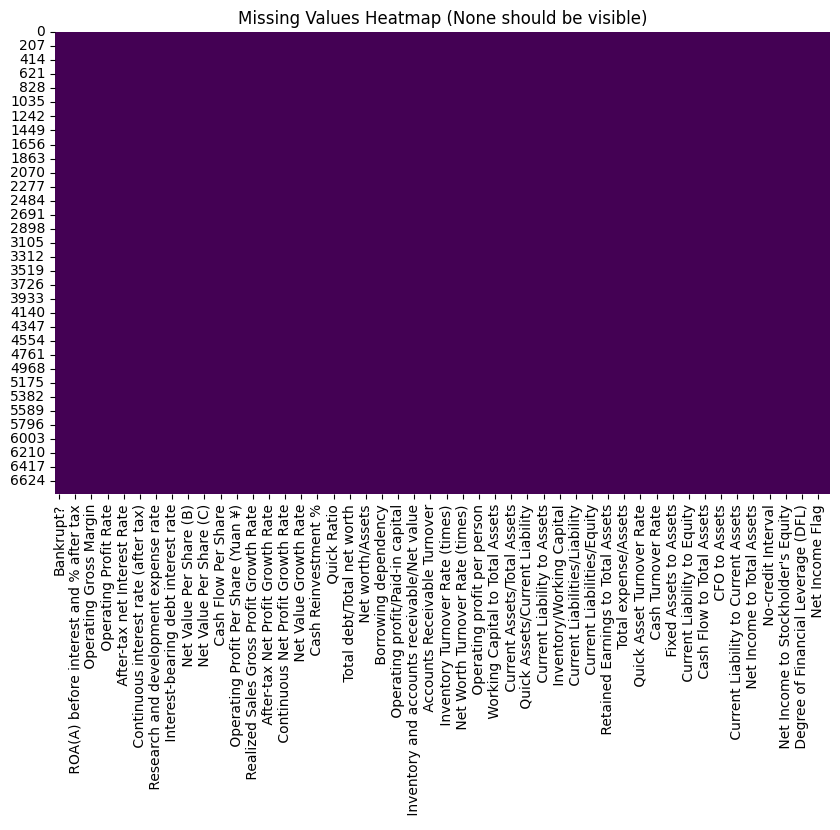

In [ ]:
# Heatmap for the missing values across all the columns
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap (None should be visible)")
plt.show()

In [ ]:
# Duplicate check
df.duplicated().sum()

np.int64(0)

In [ ]:
# Inspection of the class distribution
df['Bankrupt?'].value_counts(normalize=True)

,proportion
Bankrupt?,
0,0.967737
1,0.032263


The result above shows a **severe** class imbalance in the target variable.

In [11]:
# Analyze column value distributions and convert low-cardinality numeric columns to object

# First, display normalized value counts (percentages) for each column
for col in df.columns:
    print(f"\nNormalized value counts for column: '{col}'")
    display(df[col].value_counts(normalize=True, dropna=False).to_frame('percentage'))

# Second, convert numeric columns with ≤ 10 unique values to object (categorical-like)
numeric_cols = df.select_dtypes(include='number').columns
for col in numeric_cols:
    if df[col].nunique(dropna=False) <= 10:
        df[col] = df[col].astype('object')

# Show updated column type distribution
print("\nUpdated column type counts:")
print(df.dtypes.value_counts())


Normalized value counts for column: 'Bankrupt?'


,percentage
Bankrupt?,
0,0.967737
1,0.032263



Normalized value counts for column: ' ROA(C) before interest and depreciation before interest'


,percentage
ROA(C) before interest and depreciation before interest,
0.490128,0.001760
0.516453,0.001613
0.499196,0.001466
0.513821,0.001466
0.501926,0.001320
...,...
0.624482,0.000147
0.525910,0.000147
0.400331,0.000147



Normalized value counts for column: ' ROA(A) before interest and % after tax'


,percentage
ROA(A) before interest and % after tax,
0.559693,0.001906
0.568251,0.001906
0.554187,0.001466
0.557894,0.001466
0.566016,0.001466
...,...
0.626744,0.000147
0.662396,0.000147
0.509213,0.000147



Normalized value counts for column: ' ROA(B) before interest and depreciation after tax'


,percentage
ROA(B) before interest and depreciation after tax,
0.552492,0.001466
0.558220,0.001466
0.538787,0.001466
0.551475,0.001466
0.554045,0.001320
...,...
0.637936,0.000147
0.640024,0.000147
0.586916,0.000147



Normalized value counts for column: ' Operating Gross Margin'


,percentage
Operating Gross Margin,
0.606495,0.001027
0.605796,0.001027
0.598956,0.001027
0.601976,0.001027
0.605198,0.000880
...,...
0.601652,0.000147
0.566302,0.000147
0.614026,0.000147



Normalized value counts for column: ' Realized Sales Gross Margin'


,percentage
Realized Sales Gross Margin,
0.604715,0.001173
0.605796,0.001173
0.602589,0.001173
0.600333,0.001027
0.602682,0.001027
...,...
0.638810,0.000147
0.615006,0.000147
0.619734,0.000147



Normalized value counts for column: ' Operating Profit Rate'


,percentage
Operating Profit Rate,
0.998987,0.001760
0.998982,0.001613
0.999013,0.001613
0.999038,0.001466
0.999043,0.001320
...,...
0.998926,0.000147
0.999170,0.000147
0.998399,0.000147



Normalized value counts for column: ' Pre-tax net Interest Rate'


,percentage
Pre-tax net Interest Rate,
0.797381,0.001466
0.797424,0.001320
0.797391,0.001320
0.797422,0.001320
0.797418,0.001320
...,...
0.796923,0.000147
0.797661,0.000147
0.797433,0.000147



Normalized value counts for column: ' After-tax net Interest Rate'


,percentage
After-tax net Interest Rate,
0.809378,0.001906
0.809309,0.001906
0.809315,0.001466
0.809317,0.001320
0.809307,0.001320
...,...
0.809509,0.000147
0.809454,0.000147
0.809520,0.000147



Normalized value counts for column: ' Non-industry income and expenditure/revenue'


,percentage
Non-industry income and expenditure/revenue,
0.303528,0.002640
0.303517,0.002640
0.303526,0.002640
0.303529,0.002493
0.303531,0.002493
...,...
0.303157,0.000147
0.303384,0.000147
0.303698,0.000147



Normalized value counts for column: ' Continuous interest rate (after tax)'


,percentage
Continuous interest rate (after tax),
0.781683,0.001613
0.781576,0.001466
0.781626,0.001466
0.781594,0.001320
0.781622,0.001320
...,...
0.781822,0.000147
0.781398,0.000147
0.781935,0.000147



Normalized value counts for column: ' Operating Expense Rate'


,percentage
Operating Expense Rate,
1.716046e-04,0.001466
9.860000e+09,0.001466
5.530000e+09,0.001466
1.025696e-04,0.001320
5.450000e+09,0.001320
...,...
2.842345e-04,0.000147
4.628929e-04,0.000147
3.441342e-04,0.000147



Normalized value counts for column: ' Research and development expense rate'


,percentage
Research and development expense rate,
0.000000e+00,0.208828
4.410000e+08,0.003226
6.450000e+08,0.003080
8.150000e+08,0.003080
4.580000e+08,0.002786
...,...
2.444909e-04,0.000147
2.081569e-04,0.000147
2.896538e-04,0.000147



Normalized value counts for column: ' Cash flow rate'


,percentage
Cash flow rate,
0.460621,0.000733
0.460970,0.000733
0.464373,0.000733
0.461106,0.000587
0.464867,0.000587
...,...
0.466546,0.000147
0.466888,0.000147
0.465724,0.000147



Normalized value counts for column: ' Interest-bearing debt interest rate'


,percentage
Interest-bearing debt interest rate,
0.000000,0.130664
0.000260,0.004399
0.000266,0.004106
0.000244,0.003666
0.000312,0.003226
...,...
0.043162,0.000147
0.000930,0.000147
0.006805,0.000147



Normalized value counts for column: ' Tax rate (A)'


,percentage
Tax rate (A),
0.000000,0.376595
0.253062,0.001027
0.000405,0.001027
0.252657,0.000880
0.113777,0.000880
...,...
0.064885,0.000147
0.192833,0.000147
0.148193,0.000147



Normalized value counts for column: ' Net Value Per Share (B)'


,percentage
Net Value Per Share (B),
0.176984,0.002053
0.184611,0.001906
0.174624,0.001906
0.175509,0.001906
0.180860,0.001760
...,...
0.239434,0.000147
0.136530,0.000147
0.142472,0.000147



Normalized value counts for column: ' Net Value Per Share (A)'


,percentage
Net Value Per Share (A),
0.176984,0.002053
0.175509,0.001906
0.184611,0.001906
0.174624,0.001906
0.177953,0.001760
...,...
0.209262,0.000147
0.321478,0.000147
0.329358,0.000147



Normalized value counts for column: ' Net Value Per Share (C)'


,percentage
Net Value Per Share (C),
0.176984,0.002053
0.174624,0.001906
0.175509,0.001906
0.184611,0.001906
0.180608,0.001760
...,...
0.160887,0.000147
0.245249,0.000147
0.153470,0.000147



Normalized value counts for column: ' Persistent EPS in the Last Four Seasons'


,percentage
Persistent EPS in the Last Four Seasons,
0.214900,0.004693
0.218209,0.003960
0.214617,0.003813
0.218588,0.003813
0.218682,0.003813
...,...
0.282311,0.000147
0.283351,0.000147
0.328449,0.000147



Normalized value counts for column: ' Cash Flow Per Share'


,percentage
Cash Flow Per Share,
0.322558,0.003080
0.319198,0.003080
0.320506,0.003080
0.321285,0.002933
0.319764,0.002786
...,...
0.307102,0.000147
0.307739,0.000147
0.306642,0.000147



Normalized value counts for column: ' Revenue Per Share (Yuan ¥)'


,percentage
Revenue Per Share (Yuan ¥),
0.017756,0.001320
0.017046,0.001173
0.011328,0.001027
0.015533,0.001027
0.009725,0.001027
...,...
0.091958,0.000147
0.049034,0.000147
0.060529,0.000147



Normalized value counts for column: ' Operating Profit Per Share (Yuan ¥)'


,percentage
Operating Profit Per Share (Yuan ¥),
0.097142,0.004253
0.099340,0.004106
0.097712,0.003960
0.099503,0.003813
0.099422,0.003666
...,...
0.135901,0.000147
0.161388,0.000147
0.072551,0.000147



Normalized value counts for column: ' Per Share Net profit before tax (Yuan ¥)'


,percentage
Per Share Net profit before tax (Yuan ¥),
0.170144,0.004693
0.169993,0.004253
0.174211,0.003520
0.170897,0.003373
0.174738,0.003373
...,...
0.209761,0.000147
0.126384,0.000147
0.216540,0.000147



Normalized value counts for column: ' Realized Sales Gross Profit Growth Rate'


,percentage
Realized Sales Gross Profit Growth Rate,
0.022092,0.004693
0.022104,0.000733
0.022090,0.000733
0.022120,0.000587
0.022145,0.000587
...,...
0.022113,0.000147
0.022096,0.000147
0.025316,0.000147



Normalized value counts for column: ' Operating Profit Growth Rate'


,percentage
Operating Profit Growth Rate,
0.848045,0.000587
0.847982,0.000587
0.847957,0.000587
0.848005,0.000587
0.848022,0.000587
...,...
0.848525,0.000147
0.848130,0.000147
0.848037,0.000147



Normalized value counts for column: ' After-tax Net Profit Growth Rate'


,percentage
After-tax Net Profit Growth Rate,
0.689449,0.000587
0.689525,0.000587
0.689702,0.000587
0.689416,0.000440
0.689366,0.000440
...,...
0.689352,0.000147
0.689360,0.000147
0.689338,0.000147



Normalized value counts for column: ' Regular Net Profit Growth Rate'


,percentage
Regular Net Profit Growth Rate,
0.689449,0.000587
0.689435,0.000440
0.689359,0.000440
0.689557,0.000440
0.689321,0.000440
...,...
0.689724,0.000147
0.689462,0.000147
0.689319,0.000147



Normalized value counts for column: ' Continuous Net Profit Growth Rate'


,percentage
Continuous Net Profit Growth Rate,
0.217580,0.000587
0.217586,0.000440
0.217581,0.000440
0.217593,0.000440
0.217574,0.000440
...,...
0.217580,0.000147
0.217587,0.000147
0.217853,0.000147



Normalized value counts for column: ' Total Asset Growth Rate'


,percentage
Total Asset Growth Rate,
6.400000e+09,0.004106
6.370000e+09,0.004106
6.430000e+09,0.003960
6.440000e+09,0.003960
6.890000e+09,0.003960
...,...
5.770000e+08,0.000147
8.410000e+08,0.000147
1.015629e-04,0.000147



Normalized value counts for column: ' Net Value Growth Rate'


,percentage
Net Value Growth Rate,
0.000449,0.001173
0.000445,0.001173
0.000466,0.001027
0.000451,0.001027
0.000447,0.001027
...,...
0.000667,0.000147
0.000431,0.000147
0.000403,0.000147



Normalized value counts for column: ' Total Asset Return Growth Rate Ratio'


,percentage
Total Asset Return Growth Rate Ratio,
0.263910,0.001760
0.263994,0.001760
0.264140,0.001760
0.264097,0.001760
0.263975,0.001760
...,...
0.264452,0.000147
0.265867,0.000147
0.261368,0.000147



Normalized value counts for column: ' Cash Reinvestment %'


,percentage
Cash Reinvestment %,
0.375387,0.001466
0.375889,0.001466
0.376514,0.001320
0.386554,0.001320
0.384906,0.001173
...,...
0.370748,0.000147
0.375731,0.000147
0.395924,0.000147



Normalized value counts for column: ' Current Ratio'


,percentage
Current Ratio,
0.013174,0.000587
0.007139,0.000587
0.006145,0.000587
0.006916,0.000587
0.005888,0.000587
...,...
0.009994,0.000147
0.010525,0.000147
0.012343,0.000147



Normalized value counts for column: ' Quick Ratio'


,percentage
Quick Ratio,
0.005432,0.000733
0.006933,0.000587
0.007170,0.000587
0.009629,0.000587
0.002090,0.000587
...,...
0.000122,0.000147
0.000712,0.000147
0.000442,0.000147



Normalized value counts for column: ' Interest Expense Ratio'


,percentage
Interest Expense Ratio,
0.630612,0.092829
0.630613,0.008212
0.630613,0.005426
0.630614,0.004399
0.630613,0.003960
...,...
0.630298,0.000147
0.629535,0.000147
0.629506,0.000147



Normalized value counts for column: ' Total debt/Total net worth'


,percentage
Total debt/Total net worth,
0.003414,0.000733
0.001517,0.000733
0.003187,0.000733
0.004172,0.000587
0.001436,0.000587
...,...
0.021073,0.000147
0.022247,0.000147
0.021671,0.000147



Normalized value counts for column: ' Debt ratio %'


,percentage
Debt ratio %,
0.112918,0.000880
0.106721,0.000880
0.089156,0.000880
0.119479,0.000880
0.128216,0.000880
...,...
0.221332,0.000147
0.054570,0.000147
0.057411,0.000147



Normalized value counts for column: ' Net worth/Assets'


,percentage
Net worth/Assets,
0.887082,0.000880
0.893279,0.000880
0.910844,0.000880
0.880521,0.000880
0.871784,0.000880
...,...
0.778668,0.000147
0.945430,0.000147
0.942589,0.000147



Normalized value counts for column: ' Long-term fund suitability ratio (A)'


,percentage
Long-term fund suitability ratio (A),
0.004716,0.000880
0.005139,0.000440
0.005109,0.000440
0.005397,0.000440
0.005132,0.000440
...,...
0.005418,0.000147
0.005640,0.000147
0.005005,0.000147



Normalized value counts for column: ' Borrowing dependency'


,percentage
Borrowing dependency,
0.369637,0.169086
0.369639,0.002200
0.369638,0.001613
0.369653,0.001027
0.369657,0.000880
...,...
0.391390,0.000147
0.386246,0.000147
0.404567,0.000147



Normalized value counts for column: ' Contingent liabilities/Net worth'


,percentage
Contingent liabilities/Net worth,
0.005366,0.609767
0.005563,0.001027
0.005478,0.001027
0.005526,0.000880
0.005446,0.000880
...,...
0.007301,0.000147
0.005486,0.000147
0.006553,0.000147



Normalized value counts for column: ' Operating profit/Paid-in capital'


,percentage
Operating profit/Paid-in capital,
0.097896,0.001173
0.099288,0.001027
0.103189,0.001027
0.107211,0.000880
0.099451,0.000880
...,...
0.197624,0.000147
0.136947,0.000147
0.118431,0.000147



Normalized value counts for column: ' Net profit before tax/Paid-in capital'


,percentage
Net profit before tax/Paid-in capital,
0.178441,0.001173
0.170643,0.001027
0.169014,0.001027
0.173132,0.000880
0.171382,0.000880
...,...
0.175922,0.000147
0.143383,0.000147
0.196584,0.000147



Normalized value counts for column: ' Inventory and accounts receivable/Net value'


,percentage
Inventory and accounts receivable/Net value,
0.393663,0.001320
0.400194,0.000880
0.396341,0.000880
0.395122,0.000733
0.397332,0.000733
...,...
0.399558,0.000147
0.397465,0.000147
0.405628,0.000147



Normalized value counts for column: ' Total Asset Turnover'


,percentage
Total Asset Turnover,
0.079460,0.011145
0.103448,0.010852
0.092954,0.010412
0.113943,0.010265
0.071964,0.010265
...,...
0.578711,0.000147
1.000000,0.000147
0.517241,0.000147



Normalized value counts for column: ' Accounts Receivable Turnover'


,percentage
Accounts Receivable Turnover,
0.000712,0.003373
0.000808,0.003373
0.000716,0.003373
0.000737,0.003226
0.000670,0.003226
...,...
0.000172,0.000147
0.002804,0.000147
0.002175,0.000147



Normalized value counts for column: ' Average Collection Days'


,percentage
Average Collection Days,
0.000000,0.001027
0.007280,0.000733
0.007553,0.000733
0.007758,0.000733
0.005854,0.000587
...,...
0.006709,0.000147
0.006310,0.000147
0.010945,0.000147



Normalized value counts for column: ' Inventory Turnover Rate (times)'


,percentage
Inventory Turnover Rate (times),
1.910000e+07,0.031236
8.120000e+08,0.002346
8.370000e+09,0.002053
5.690000e+09,0.002053
8.100000e+09,0.002053
...,...
1.788444e-03,0.000147
2.801322e-03,0.000147
7.576046e-04,0.000147



Normalized value counts for column: ' Fixed Assets Turnover Frequency'


,percentage
Fixed Assets Turnover Frequency,
1.021272e-04,0.002933
1.429781e-04,0.002786
6.280000e+09,0.002640
8.470000e+09,0.002640
7.870000e+08,0.002640
...,...
2.308075e-03,0.000147
1.971433e-03,0.000147
3.961022e-03,0.000147



Normalized value counts for column: ' Net Worth Turnover Rate (times)'


,percentage
Net Worth Turnover Rate (times),
0.028387,0.007919
0.026129,0.007039
0.021613,0.006746
0.026452,0.006599
0.022419,0.006453
...,...
0.158871,0.000147
0.142419,0.000147
0.146774,0.000147



Normalized value counts for column: ' Revenue per person'


,percentage
Revenue per person,
0.013610,0.000880
0.023794,0.000733
0.007597,0.000733
0.008155,0.000733
0.008681,0.000733
...,...
0.057271,0.000147
0.011800,0.000147
0.004066,0.000147



Normalized value counts for column: ' Operating profit per person'


,percentage
Operating profit per person,
0.394462,0.001906
0.394903,0.001613
0.395152,0.001613
0.392268,0.001613
0.393207,0.001613
...,...
0.408856,0.000147
0.413220,0.000147
0.412892,0.000147



Normalized value counts for column: ' Allocation rate per person'


,percentage
Allocation rate per person,
0.000000,0.000880
0.000171,0.000293
0.003448,0.000293
0.011031,0.000293
0.010820,0.000293
...,...
0.001408,0.000147
0.065046,0.000147
0.002466,0.000147



Normalized value counts for column: ' Working Capital to Total Assets'


,percentage
Working Capital to Total Assets,
0.873759,0.000147
0.672775,0.000147
0.751111,0.000147
0.820361,0.000147
0.868213,0.000147
...,...
0.797005,0.000147
0.729416,0.000147
0.686729,0.000147



Normalized value counts for column: ' Quick Assets/Total Assets'


,percentage
Quick Assets/Total Assets,
0.527136,0.000147
0.166673,0.000147
0.127236,0.000147
0.357670,0.000147
0.540441,0.000147
...,...
0.361219,0.000147
0.255093,0.000147
0.080264,0.000147



Normalized value counts for column: ' Current Assets/Total Assets'


,percentage
Current Assets/Total Assets,
0.505010,0.000147
0.190643,0.000147
0.182419,0.000147
0.516250,0.000147
0.599636,0.000147
...,...
0.447942,0.000147
0.295221,0.000147
0.214536,0.000147



Normalized value counts for column: ' Cash/Total Assets'


,percentage
Cash/Total Assets,
0.238147,0.000147
0.004094,0.000147
0.014948,0.000147
0.125912,0.000147
0.118058,0.000147
...,...
0.014616,0.000147
0.022989,0.000147
0.002645,0.000147



Normalized value counts for column: ' Quick Assets/Current Liability'


,percentage
Quick Assets/Current Liability,
0.051481,0.000147
0.001997,0.000147
0.004136,0.000147
0.007975,0.000147
0.018363,0.000147
...,...
0.007565,0.000147
0.003974,0.000147
0.000988,0.000147



Normalized value counts for column: ' Cash/Current Liability'


,percentage
Cash/Current Liability,
8.870000e+09,0.000293
7.510000e+09,0.000293
4.610000e+09,0.000293
1.805309e-03,0.000147
3.394740e-04,0.000147
...,...
5.309684e-04,0.000147
6.051128e-04,0.000147
1.224340e-04,0.000147



Normalized value counts for column: ' Current Liability to Assets'


,percentage
Current Liability to Assets,
0.018517,0.000147
0.147308,0.000147
0.056963,0.000147
0.081832,0.000147
0.053790,0.000147
...,...
0.087042,0.000147
0.115920,0.000147
0.139002,0.000147



Normalized value counts for column: ' Operating Funds to Liability'


,percentage
Operating Funds to Liability,
0.239585,0.000147
0.334015,0.000147
0.341106,0.000147
0.349922,0.000147
0.347097,0.000147
...,...
0.353511,0.000147
0.340081,0.000147
0.350563,0.000147



Normalized value counts for column: ' Inventory/Working Capital'


,percentage
Inventory/Working Capital,
0.276975,0.033289
0.277329,0.000147
0.277154,0.000147
0.277078,0.000147
0.277248,0.000147
...,...
0.277815,0.000147
0.278719,0.000147
0.278551,0.000147



Normalized value counts for column: ' Inventory/Current Liability'


,percentage
Inventory/Current Liability,
0.000000e+00,0.033289
5.280000e+09,0.000293
8.790000e+09,0.000293
5.070000e+09,0.000293
3.408665e-03,0.000147
...,...
2.048474e-02,0.000147
7.027117e-03,0.000147
2.195631e-02,0.000147



Normalized value counts for column: ' Current Liabilities/Liability'


,percentage
Current Liabilities/Liability,
1.000000,0.028303
0.976266,0.000147
0.889869,0.000147
0.923683,0.000147
0.846713,0.000147
...,...
0.832751,0.000147
0.997203,0.000147
0.701159,0.000147



Normalized value counts for column: ' Working Capital/Equity'


,percentage
Working Capital/Equity,
0.737286,0.000147
0.721275,0.000147
0.731975,0.000147
0.736479,0.000147
0.738195,0.000147
...,...
0.734946,0.000147
0.728731,0.000147
0.725202,0.000147



Normalized value counts for column: ' Current Liabilities/Equity'


,percentage
Current Liabilities/Equity,
0.326690,0.000147
0.339077,0.000147
0.329740,0.000147
0.329594,0.000147
0.328010,0.000147
...,...
0.329804,0.000147
0.337392,0.000147
0.335534,0.000147



Normalized value counts for column: ' Long-term Liability to Current Assets'


,percentage
Long-term Liability to Current Assets,
0.000000e+00,0.376741
2.790000e+08,0.000293
5.790000e+08,0.000293
2.469244e-02,0.000147
2.880271e-03,0.000147
...,...
1.920142e-03,0.000147
4.349533e-02,0.000147
1.640000e-03,0.000147



Normalized value counts for column: ' Retained Earnings to Total Assets'


,percentage
Retained Earnings to Total Assets,
0.938005,0.000147
0.903225,0.000147
0.931065,0.000147
0.961869,0.000147
0.953155,0.000147
...,...
0.935449,0.000147
0.911441,0.000147
0.903041,0.000147



Normalized value counts for column: ' Total income/Total expense'


,percentage
Total income/Total expense,
0.002791,0.000147
0.002022,0.000147
0.002226,0.000147
0.002525,0.000147
0.002481,0.000147
...,...
0.002360,0.000147
0.002121,0.000147
0.001866,0.000147



Normalized value counts for column: ' Total expense/Assets'


,percentage
Total expense/Assets,
0.006089,0.000147
0.064856,0.000147
0.025516,0.000147
0.024113,0.000147
0.027416,0.000147
...,...
0.025482,0.000147
0.092802,0.000147
0.040094,0.000147



Normalized value counts for column: ' Current Asset Turnover Rate'


,percentage
Current Asset Turnover Rate,
8.580000e+09,0.001173
9.980000e+09,0.001027
9.660000e+09,0.001027
9.950000e+09,0.001027
9.470000e+09,0.001027
...,...
2.809200e-01,0.000147
1.484665e-04,0.000147
1.296744e-03,0.000147



Normalized value counts for column: ' Quick Asset Turnover Rate'


,percentage
Quick Asset Turnover Rate,
6.460000e+09,0.001613
9.160000e+09,0.001320
8.590000e+09,0.001320
9.590000e+09,0.001320
8.480000e+09,0.001173
...,...
1.585990e-04,0.000147
1.919990e-03,0.000147
1.058855e-04,0.000147



Normalized value counts for column: ' Working capitcal Turnover Rate'


,percentage
Working capitcal Turnover Rate,
0.598674,0.000147
0.593831,0.000147
0.593916,0.000147
0.593963,0.000147
0.594035,0.000147
...,...
0.593937,0.000147
0.593893,0.000147
0.593846,0.000147



Normalized value counts for column: ' Cash Turnover Rate'


,percentage
Cash Turnover Rate,
1.940000e+09,0.001760
3.020000e+09,0.001613
2.060000e+09,0.001613
1.930000e+09,0.001613
2.110000e+09,0.001466
...,...
1.291028e-04,0.000147
2.081306e-04,0.000147
8.240000e+08,0.000147



Normalized value counts for column: ' Cash Flow to Sales'


,percentage
Cash Flow to Sales,
0.672096,0.000147
0.671568,0.000147
0.671570,0.000147
0.671574,0.000147
0.671566,0.000147
...,...
0.671572,0.000147
0.671562,0.000147
0.671568,0.000147



Normalized value counts for column: ' Fixed Assets to Assets'


,percentage
Fixed Assets to Assets,
0.000000,0.000880
0.140569,0.000147
0.228906,0.000147
0.049644,0.000147
0.085945,0.000147
...,...
0.001455,0.000147
0.106627,0.000147
0.039281,0.000147



Normalized value counts for column: ' Current Liability to Liability'


,percentage
Current Liability to Liability,
1.000000,0.028303
0.976266,0.000147
0.889869,0.000147
0.923683,0.000147
0.846713,0.000147
...,...
0.832751,0.000147
0.997203,0.000147
0.701159,0.000147



Normalized value counts for column: ' Current Liability to Equity'


,percentage
Current Liability to Equity,
0.326690,0.000147
0.339077,0.000147
0.329740,0.000147
0.329594,0.000147
0.328010,0.000147
...,...
0.329804,0.000147
0.337392,0.000147
0.335534,0.000147



Normalized value counts for column: ' Equity to Long-term Liability'


,percentage
Equity to Long-term Liability,
0.110933,0.376741
0.115569,0.000147
0.123068,0.000147
0.113518,0.000147
0.114183,0.000147
...,...
0.113223,0.000147
0.141872,0.000147
0.111597,0.000147



Normalized value counts for column: ' Cash Flow to Total Assets'


,percentage
Cash Flow to Total Assets,
0.659917,0.000147
0.637555,0.000147
0.641100,0.000147
0.646511,0.000147
0.635306,0.000147
...,...
0.641553,0.000147
0.630419,0.000147
0.637470,0.000147



Normalized value counts for column: ' Cash Flow to Liability'


,percentage
Cash Flow to Liability,
0.483285,0.000147
0.458609,0.000147
0.459001,0.000147
0.460106,0.000147
0.456438,0.000147
...,...
0.458954,0.000147
0.457785,0.000147
0.458499,0.000147



Normalized value counts for column: ' CFO to Assets'


,percentage
CFO to Assets,
0.505531,0.000147
0.520382,0.000147
0.567101,0.000147
0.597502,0.000147
0.578840,0.000147
...,...
0.610091,0.000147
0.560653,0.000147
0.622190,0.000147



Normalized value counts for column: ' Cash Flow to Equity'


,percentage
Cash Flow to Equity,
0.316238,0.000147
0.312905,0.000147
0.314163,0.000147
0.315095,0.000147
0.313648,0.000147
...,...
0.314364,0.000147
0.310296,0.000147
0.313268,0.000147



Normalized value counts for column: ' Current Liability to Current Assets'


,percentage
Current Liability to Current Assets,
0.005579,0.000147
0.118250,0.000147
0.047775,0.000147
0.024640,0.000147
0.013882,0.000147
...,...
0.030201,0.000147
0.060765,0.000147
0.099522,0.000147



Normalized value counts for column: ' Liability-Assets Flag'


,percentage
Liability-Assets Flag,
0,0.998827
1,0.001173



Normalized value counts for column: ' Net Income to Total Assets'


,percentage
Net Income to Total Assets,
0.815956,0.000147
0.716845,0.000147
0.795297,0.000147
0.837615,0.000147
0.836314,0.000147
...,...
0.815350,0.000147
0.736619,0.000147
0.710420,0.000147



Normalized value counts for column: ' Total assets to GNP price'


,percentage
Total assets to GNP price,
0.003661,0.000293
0.005242,0.000147
0.001612,0.000147
0.002792,0.000147
0.004598,0.000147
...,...
0.002215,0.000147
0.007804,0.000147
0.009983,0.000147



Normalized value counts for column: ' No-credit Interval'


,percentage
No-credit Interval,
0.626680,0.000147
0.622879,0.000147
0.623652,0.000147
0.623844,0.000147
0.624129,0.000147
...,...
0.623843,0.000147
0.623655,0.000147
0.622605,0.000147



Normalized value counts for column: ' Gross Profit to Sales'


,percentage
Gross Profit to Sales,
0.665149,0.000587
0.619784,0.000147
0.606845,0.000147
0.603101,0.000147
0.617243,0.000147
...,...
0.609046,0.000147
0.615280,0.000147
0.616313,0.000147



Normalized value counts for column: ' Net Income to Stockholder's Equity'


,percentage
Net Income to Stockholder's Equity,
0.841019,0.000147
0.827890,0.000147
0.839969,0.000147
0.843094,0.000147
0.842457,0.000147
...,...
0.841459,0.000147
0.829980,0.000147
0.829939,0.000147



Normalized value counts for column: ' Liability to Equity'


,percentage
Liability to Equity,
0.275114,0.000147
0.290202,0.000147
0.283846,0.000147
0.278630,0.000147
0.276694,0.000147
...,...
0.278607,0.000147
0.292504,0.000147
0.285087,0.000147



Normalized value counts for column: ' Degree of Financial Leverage (DFL)'


,percentage
Degree of Financial Leverage (DFL),
0.026791,0.085056
0.026845,0.000147
0.026820,0.000147
0.026892,0.000147
0.026795,0.000147
...,...
0.026691,0.000147
0.028833,0.000147
0.026586,0.000147



Normalized value counts for column: ' Interest Coverage Ratio (Interest expense to EBIT)'


,percentage
Interest Coverage Ratio (Interest expense to EBIT),
0.565158,0.085056
0.565404,0.000147
0.565294,0.000147
0.565596,0.000147
0.565177,0.000147
...,...
0.564631,0.000147
0.568479,0.000147
0.563947,0.000147



Normalized value counts for column: ' Net Income Flag'


,percentage
Net Income Flag,
1,1.0



Normalized value counts for column: ' Equity to Liability'


,percentage
Equity to Liability,
0.233902,0.000147
0.016469,0.000147
0.020794,0.000147
0.034748,0.000147
0.058338,0.000147
...,...
0.034889,0.000147
0.015663,0.000147
0.019534,0.000147



Updated column type counts:
float64    93
object      3
Name: count, dtype: int64


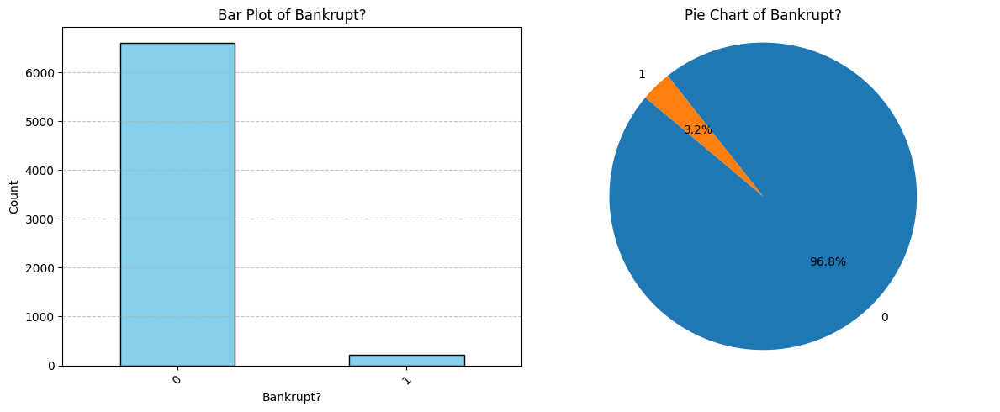

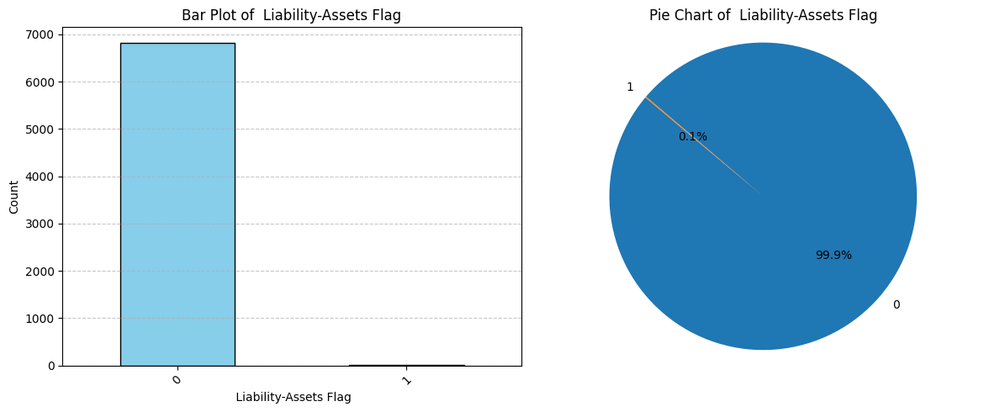

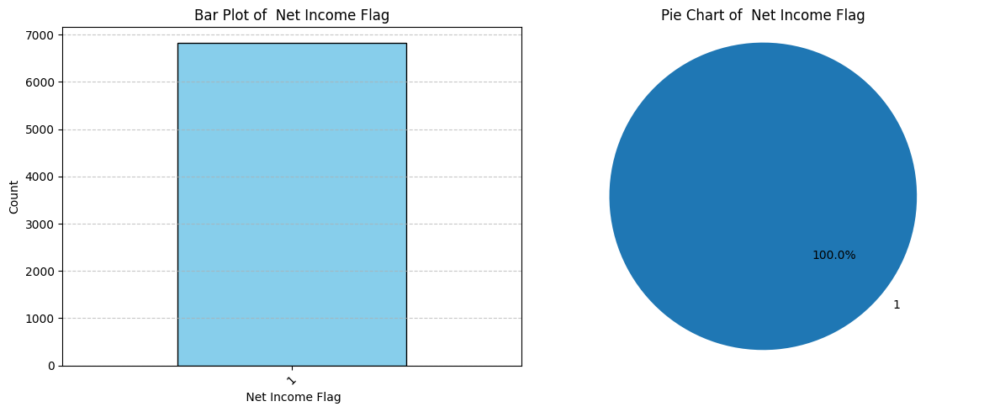

In [12]:
def plot_categorical_columns(df):
    """
    Plots bar and pie charts for all categorical (object) columns in the DataFrame.
    """
    cat_columns = df.select_dtypes(include='object').columns.tolist()

    for col in cat_columns:
        counts = df[col].value_counts()

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        # Bar Plot
        counts.plot(kind='bar', ax=axes[0], color='skyblue', edgecolor='black')
        axes[0].set_title(f'Bar Plot of {col}')
        axes[0].set_xlabel(col)
        axes[0].set_ylabel('Count')
        axes[0].tick_params(axis='x', rotation=45)
        axes[0].grid(axis='y', linestyle='--', alpha=0.7)

        # Pie Chart
        axes[1].pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140)
        axes[1].set_title(f'Pie Chart of {col}')
        axes[1].axis('equal')

        plt.tight_layout()
        plt.show()

# Plot only the remaining categorical columns
plot_categorical_columns(df)

In [13]:
# Drop irrelevant categorical columns

df = df.drop(['Liability-Assets Flag', 'Net Income Flag'], axis=1, errors='ignore')

Inspection of outliers

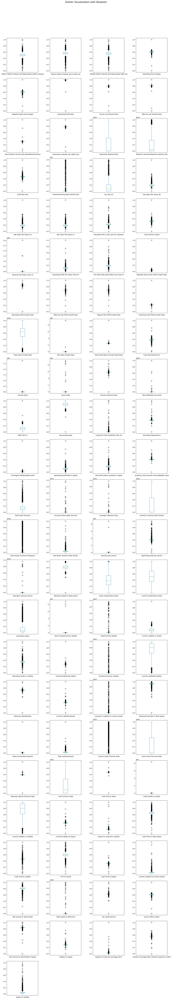

In [16]:
# Get number of numeric columns
num_cols = len(df.select_dtypes(include='number').columns)
cols_per_row = 4
num_rows = math.ceil(num_cols / cols_per_row)

# Create boxplots with dynamic layout
df.select_dtypes(include='number').plot(
    kind='box',
    subplots=True,
    layout=(num_rows, cols_per_row),
    figsize=(cols_per_row * 4, num_rows * 4),
    sharey=False
)

plt.suptitle('Outlier Visualization with Boxplots', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Leave space for the title
plt.show()

Inspection of correlation in the data

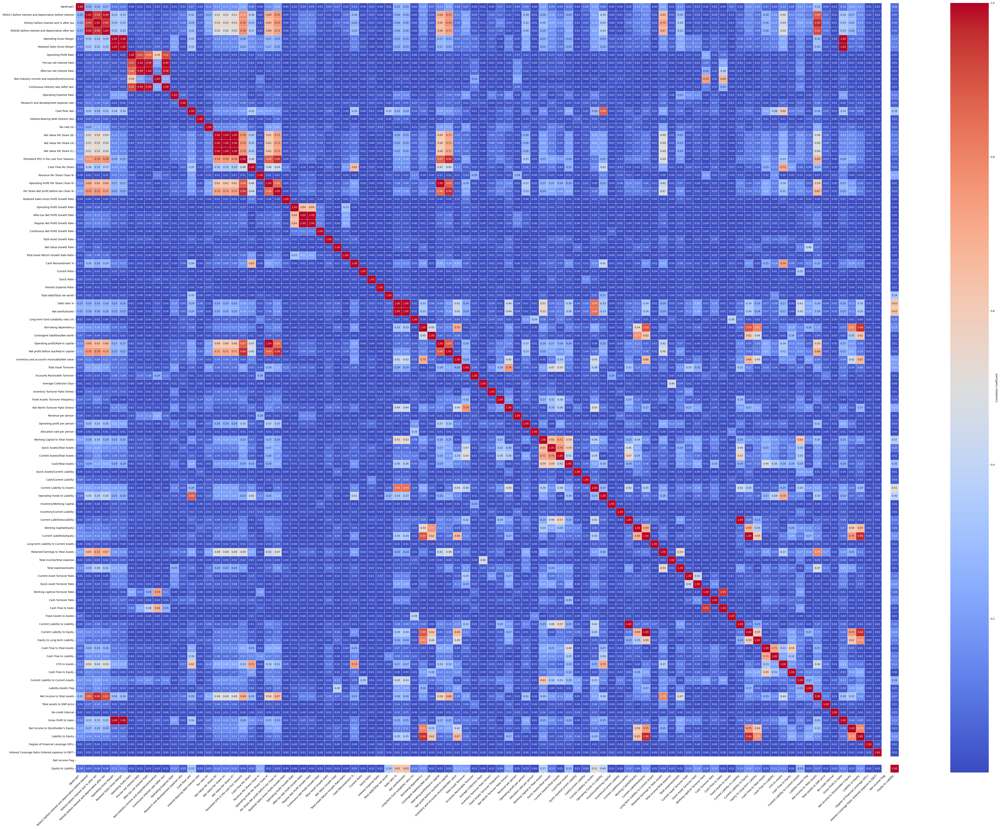

In [18]:
# Compute correlation matrix on cleaned data
corr_matrix = df.corr().abs()

# Plot the heatmap
plt.figure(figsize=(60, 45))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    linewidths=0.5,
    annot_kws={"size": 10},
    cbar_kws={'label': 'Correlation Coefficient'}
)

# Adjust axis labels and font size
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Display the plot
plt.tight_layout()
plt.show()


In [21]:
target_column = df.columns[0]

# Calculate correlation with target variable
correlations = df.corr()[target_column].abs().sort_values(ascending=False)

# Remove the target variable itself from the correlations
correlations = correlations.drop(target_column)

# Get top 10 features most correlated with target
top_10_features = correlations.head(10).index.tolist()

print("Top 10 Features Most Correlated with Target Variable:")
print("=" * 55)
for i, feature in enumerate(top_10_features, 1):
    corr_value = correlations[feature]
    print(f"{i:2d}. {feature}: {corr_value:.4f}")

Top 10 Features Most Correlated with Target Variable:
 1.  Net Income to Total Assets: 0.3155
 2.  ROA(A) before interest and % after tax: 0.2829
 3.  ROA(B) before interest and depreciation after tax: 0.2731
 4.  ROA(C) before interest and depreciation before interest: 0.2608
 5.  Net worth/Assets: 0.2502
 6.  Debt ratio %: 0.2502
 7.  Persistent EPS in the Last Four Seasons: 0.2196
 8.  Retained Earnings to Total Assets: 0.2178
 9.  Net profit before tax/Paid-in capital: 0.2079
10.  Per Share Net profit before tax (Yuan ¥): 0.2014


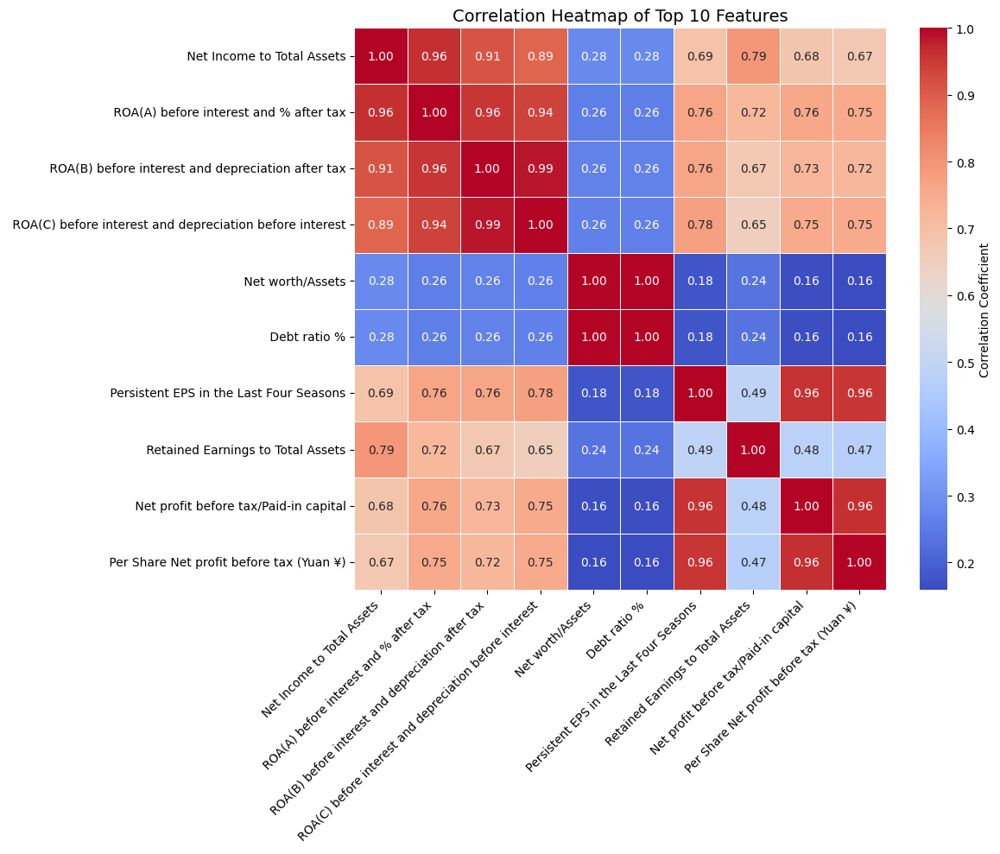


 Highly Correlated Feature Pairs (>|0.9|):

-  ROA(A) before interest and % after tax and  Net Income to Total Assets: Correlation = 0.96
-  ROA(B) before interest and depreciation after tax and  Net Income to Total Assets: Correlation = 0.91
-  ROA(B) before interest and depreciation after tax and  ROA(A) before interest and % after tax: Correlation = 0.96
-  ROA(C) before interest and depreciation before interest and  ROA(A) before interest and % after tax: Correlation = 0.94
-  ROA(C) before interest and depreciation before interest and  ROA(B) before interest and depreciation after tax: Correlation = 0.99
-  Debt ratio % and  Net worth/Assets: Correlation = 1.00
-  Net profit before tax/Paid-in capital and  Persistent EPS in the Last Four Seasons: Correlation = 0.96
-  Per Share Net profit before tax (Yuan ¥) and  Persistent EPS in the Last Four Seasons: Correlation = 0.96
-  Per Share Net profit before tax (Yuan ¥) and  Net profit before tax/Paid-in capital: Correlation = 0.96


In [22]:
# Plotting the correlated features in a heatmap
corr_matrix = df[top_10_features].corr().abs()
plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    linewidths=0.5,
    annot_kws={"size": 10},
    cbar_kws={'label': 'Correlation Coefficient'}
)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.yticks(fontsize=10)
plt.title("Correlation Heatmap of Top 10 Features", fontsize=14)
plt.tight_layout()
plt.show()

# Function to find highly correlated feature pairs
def find_highly_correlated(corr_matrix, threshold=0.9):
    correlated_pairs = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:
                correlated_pairs.append((corr_matrix.columns[i], corr_matrix.columns[j], corr_matrix.iloc[i, j]))
    return correlated_pairs

# Apply the function to detect highly correlated pairs
high_corr_pairs = find_highly_correlated(corr_matrix, threshold=0.9)

# Display the results
print("\n Highly Correlated Feature Pairs (>|0.9|):\n")
for f1, f2, corr_value in high_corr_pairs:
    print(f"- {f1} and {f2}: Correlation = {corr_value:.2f}")

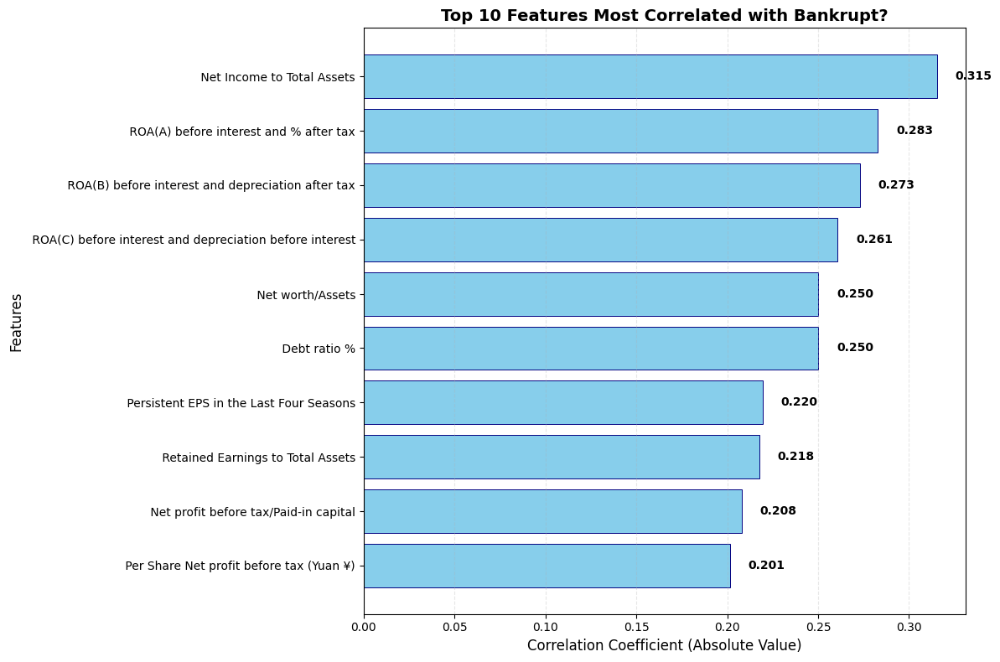

In [25]:
# Get the correlation values for the top 10 features (sorted in decreasing order)
top_10_correlations = correlations.head(10)

# Create horizontal bar chart
plt.figure(figsize=(12, 8))
bars = plt.barh(range(len(top_10_correlations)), top_10_correlations.values,
                color='skyblue', edgecolor='navy', linewidth=0.7)

# Customize the plot
plt.xlabel('Correlation Coefficient (Absolute Value)', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.title(f'Top 10 Features Most Correlated with {target_column}', fontsize=14, fontweight='bold')

# Set y-axis labels (features names)
plt.yticks(range(len(top_10_correlations)), top_10_correlations.index, fontsize=10)

# Add correlation values on the bars
for i, (feature, corr_val) in enumerate(top_10_correlations.items()):
    plt.text(corr_val + 0.01, i, f'{corr_val:.3f}',
             va='center', ha='left', fontsize=10, fontweight='bold')

# Add a grid for better readability
plt.grid(axis='x', alpha=0.3, linestyle='--')

# Invert y-axis to show highest correlation at the top
plt.gca().invert_yaxis()

# Adjust layout and display
plt.tight_layout()
plt.show()

# Preprocessing

In [26]:
df_normalized = df.copy()

# Select only numerical columns
num_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Initialize the scaler
scaler = StandardScaler()

# Apply Min-Max normalization
df_normalized[num_columns] = scaler.fit_transform(df[num_columns])

Handling outliers using std capping

In [28]:
threshold = 4
df_capped = df_normalized.copy()

for col in df_capped.select_dtypes(include='number').columns:
    mean = df_capped[col].mean()
    std = df_capped[col].std()
    upper = mean + threshold * std
    lower = mean - threshold * std

    df_capped[col] = df_capped[col].clip(lower=lower, upper=upper)

Comparison of Data Before and After Normalization and Outlier Handling

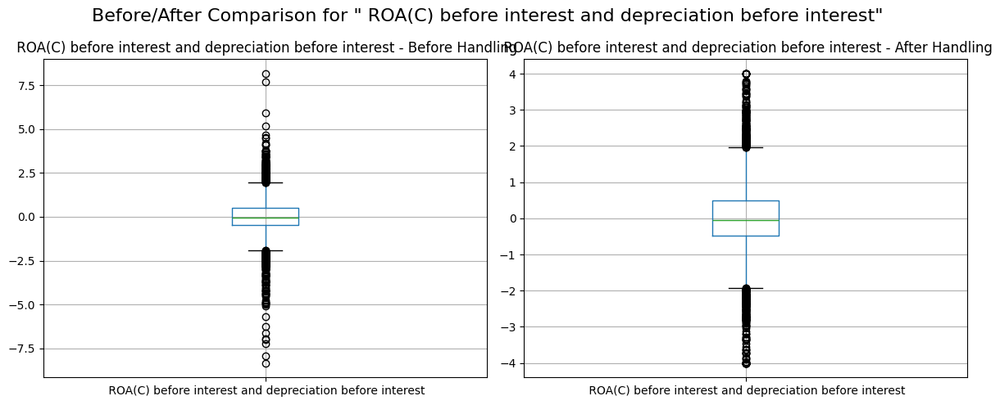

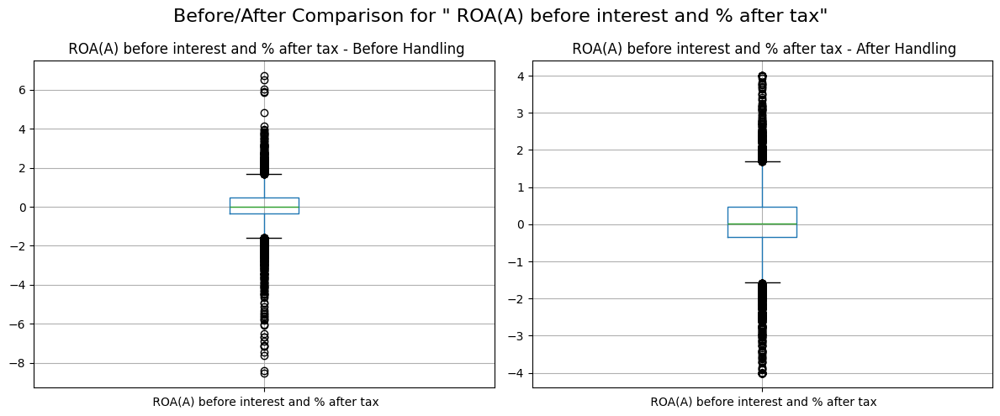

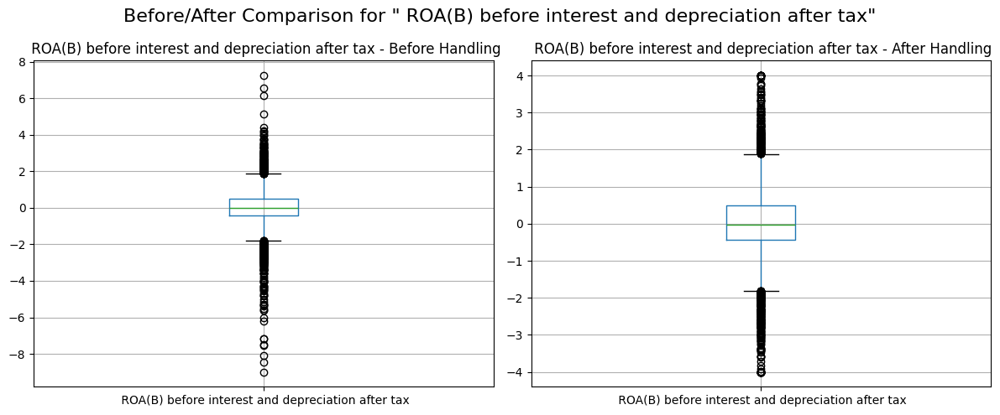

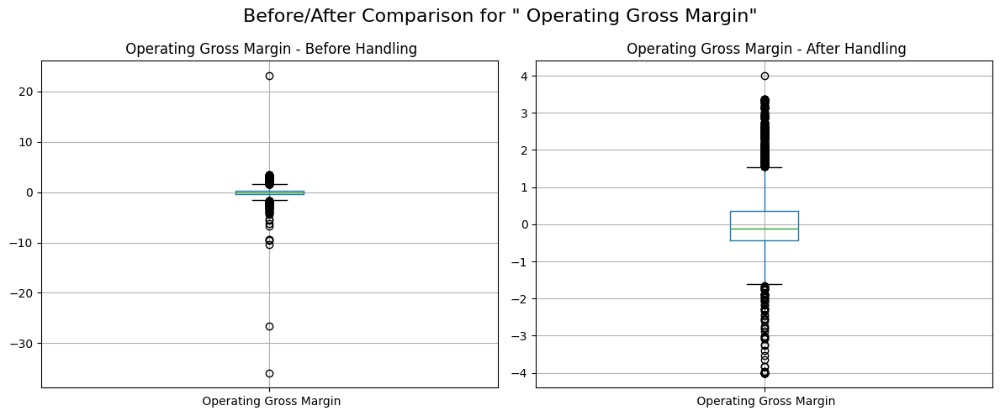

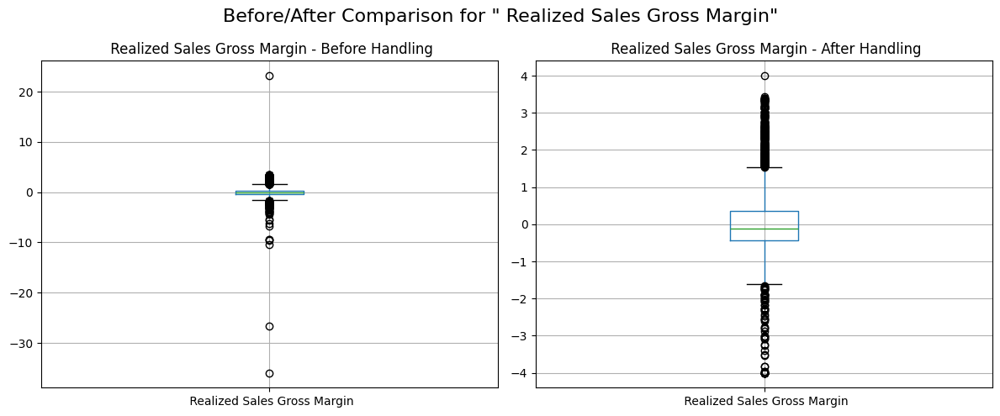

...

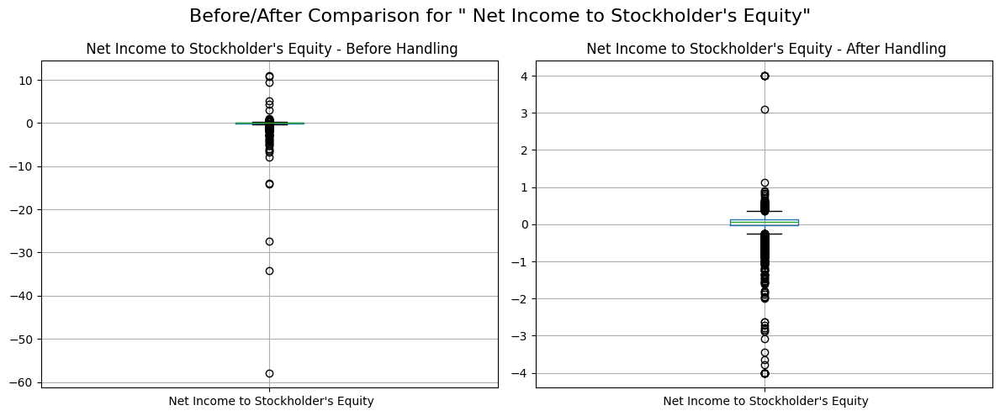

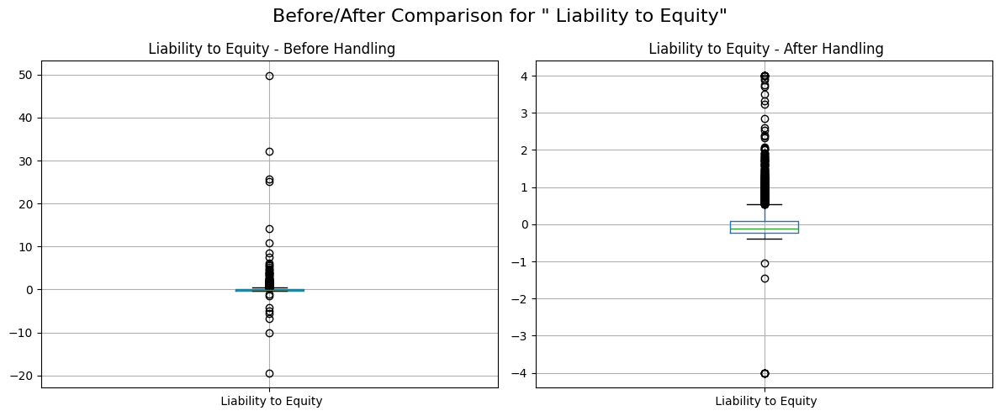

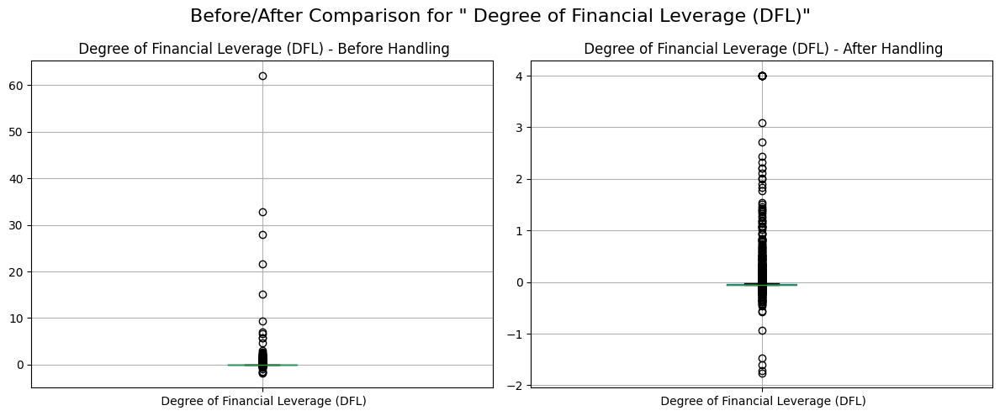

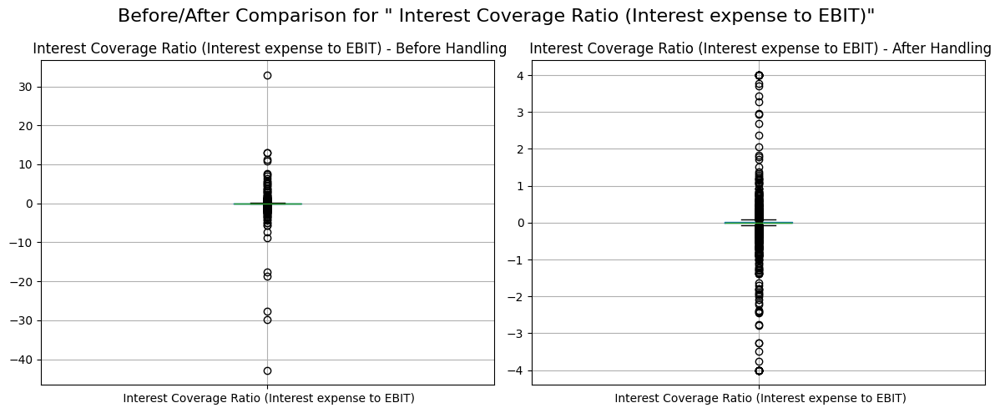

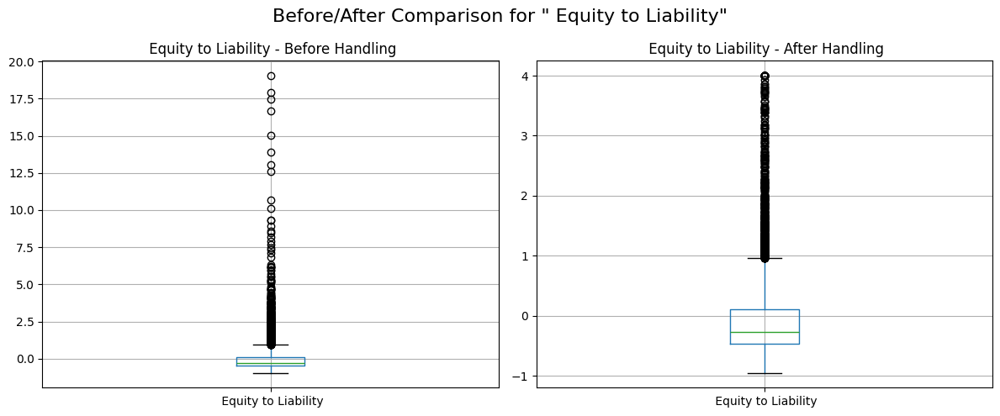

In [29]:
# List of numeric columns
numeric_cols = df_normalized.select_dtypes(include='number').columns

# Loop through each column and plot 'before' and 'after' side-by-side
for col in numeric_cols:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Before handling outliers
    df_normalized.boxplot(column=col, ax=axes[0])
    axes[0].set_title(f'{col} - Before Handling')

    # After handling outliers (standard deviation capping)
    df_capped.boxplot(column=col, ax=axes[1])
    axes[1].set_title(f'{col} - After Handling')

    plt.suptitle(f'Before/After Comparison for "{col}"', fontsize=16)
    plt.tight_layout()
    plt.show()

Handling Multicollinearity

In [37]:
def find_highly_correlated(corr_matrix, threshold=0.9):
    correlated_pairs = []
    cols = corr_matrix.columns
    for i in range(len(cols)):
        for j in range(i):
            corr_val = corr_matrix.iloc[i, j]
            if pd.notna(corr_val) and abs(corr_val) > threshold:
                correlated_pairs.append((cols[i], cols[j], corr_val))
    return correlated_pairs

def drop_correlated_features(df_clean, features, target_col='Bankrupt?', corr_threshold=0.9):
    # Compute correlation matrix for features only
    corr_matrix = df_clean[features].corr().abs()
    correlated_pairs = find_highly_correlated(corr_matrix, threshold=corr_threshold)

    to_drop = set()

    for f1, f2, corr_value in correlated_pairs:
        # Compute correlation with target, drop NaNs
        corr_with_target_f1 = abs(df_clean[[f1, target_col]].dropna().corr().iloc[0, 1])
        corr_with_target_f2 = abs(df_clean[[f2, target_col]].dropna().corr().iloc[0, 1])

        # Drop the feature with lower correlation with target
        if corr_with_target_f1 > corr_with_target_f2:
            to_drop.add(f2)
        else:
            to_drop.add(f1)

    cleaned_features = [f for f in features if f not in to_drop]

    print(f"\nDropped features due to high correlation: {list(to_drop)}")
    print(f"Remaining features after cleaning: {cleaned_features}")

    return cleaned_features

final_features = drop_correlated_features(df_capped, top_10_features, target_col='Bankrupt?', corr_threshold=0.9)



Dropped features due to high correlation: [' Net worth/Assets', ' ROA(C) before interest and depreciation before interest', ' Per Share Net profit before tax (Yuan ¥)', ' ROA(A) before interest and % after tax', ' Net profit before tax/Paid-in capital', ' ROA(B) before interest and depreciation after tax']
Remaining features after cleaning: [' Net Income to Total Assets', ' Debt ratio %', ' Persistent EPS in the Last Four Seasons', ' Retained Earnings to Total Assets']


In [40]:
# Get the list of dropped features from your multicollinearity analysis
dropped_features = [' Net worth/Assets',
                   ' ROA(C) before interest and depreciation before interest',
                   ' Per Share Net profit before tax (Yuan ¥)',
                   ' ROA(A) before interest and % after tax',
                   ' Net profit before tax/Paid-in capital',
                   ' ROA(B) before interest and depreciation after tax']

# Create 'df_final' by dropping the highly correlated features
df_final = df_capped.drop(columns=dropped_features)

# Display information about the final dataframe
print("Original DataFrame shape:", df_capped.shape)
print("Final DataFrame shape:", df_final.shape)
print(f"Features dropped: {len(dropped_features)}")
print(f"Features remaining: {df_final.shape[1]}")

print("\nDropped features:")
for i, feature in enumerate(dropped_features, 1):
    print(f"{i}. {feature}")
# This is the final dataframe that is ready to use in modeling

Original DataFrame shape: (6819, 96)
Final DataFrame shape: (6819, 90)
Features dropped: 6
Features remaining: 90

Dropped features:
1.  Net worth/Assets
2.  ROA(C) before interest and depreciation before interest
3.  Per Share Net profit before tax (Yuan ¥)
4.  ROA(A) before interest and % after tax
5.  Net profit before tax/Paid-in capital
6.  ROA(B) before interest and depreciation after tax


# Modeling



--- Tuned LR (th=0.926) ---
Accuracy: 96.19%,  F1: 0.490
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1320
           1       0.43      0.57      0.49        44

    accuracy                           0.96      1364
   macro avg       0.71      0.77      0.74      1364
weighted avg       0.97      0.96      0.96      1364


--- Tuned XGB (th=0.823) ---
Accuracy: 95.31%,  F1: 0.475
              precision    recall  f1-score   support

           0       0.99      0.96      0.98      1320
           1       0.37      0.66      0.48        44

    accuracy                           0.95      1364
   macro avg       0.68      0.81      0.73      1364
weighted avg       0.97      0.95      0.96      1364


--- Tuned SVM (th=0.887) ---
Accuracy: 95.09%,  F1: 0.374
              precision    recall  f1-score   support

           0       0.98      0.97      0.97      1320
           1       0.32      0.45      0.37        44

    ac

/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(



--- Tuned ANN (th=0.839) ---
Accuracy: 95.82%,  F1: 0.329
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1320
           1       0.34      0.32      0.33        44

    accuracy                           0.96      1364
   macro avg       0.66      0.65      0.65      1364
weighted avg       0.96      0.96      0.96      1364


--- Default LR (th=0.926) ---
Accuracy: 96.19%,  F1: 0.490
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1320
           1       0.43      0.57      0.49        44

    accuracy                           0.96      1364
   macro avg       0.71      0.77      0.74      1364
weighted avg       0.97      0.96      0.96      1364


--- Default XGB (th=0.640) ---
Accuracy: 94.94%,  F1: 0.430
              precision    recall  f1-score   support

           0       0.99      0.96      0.97      1320
           1       0.34      0.59      0.43        44

  

/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(



--- Default ANN (th=0.845) ---
Accuracy: 95.60%,  F1: 0.444
              precision    recall  f1-score   support

           0       0.98      0.97      0.98      1320
           1       0.38      0.55      0.44        44

    accuracy                           0.96      1364
   macro avg       0.68      0.76      0.71      1364
weighted avg       0.96      0.96      0.96      1364



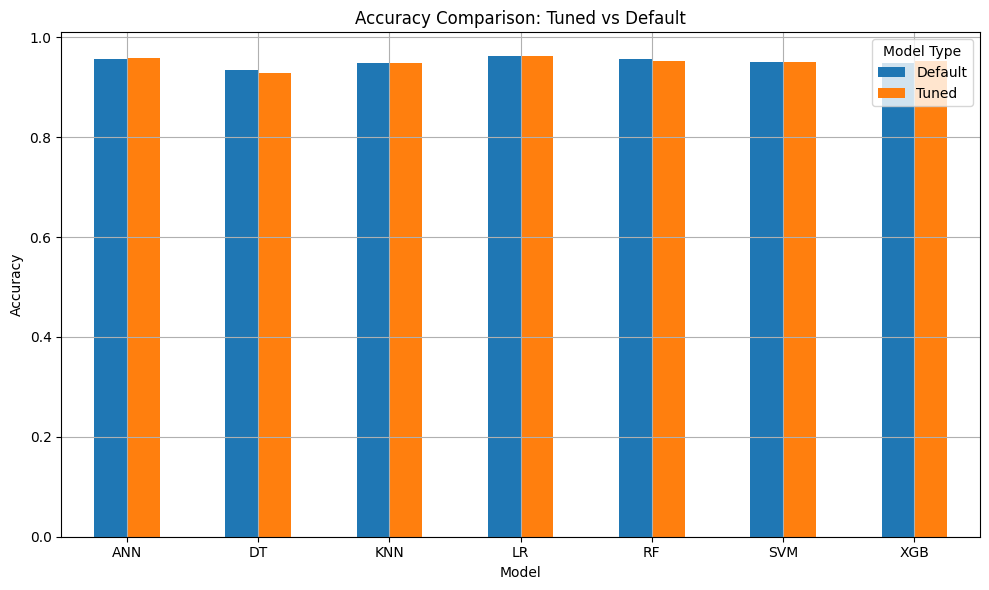

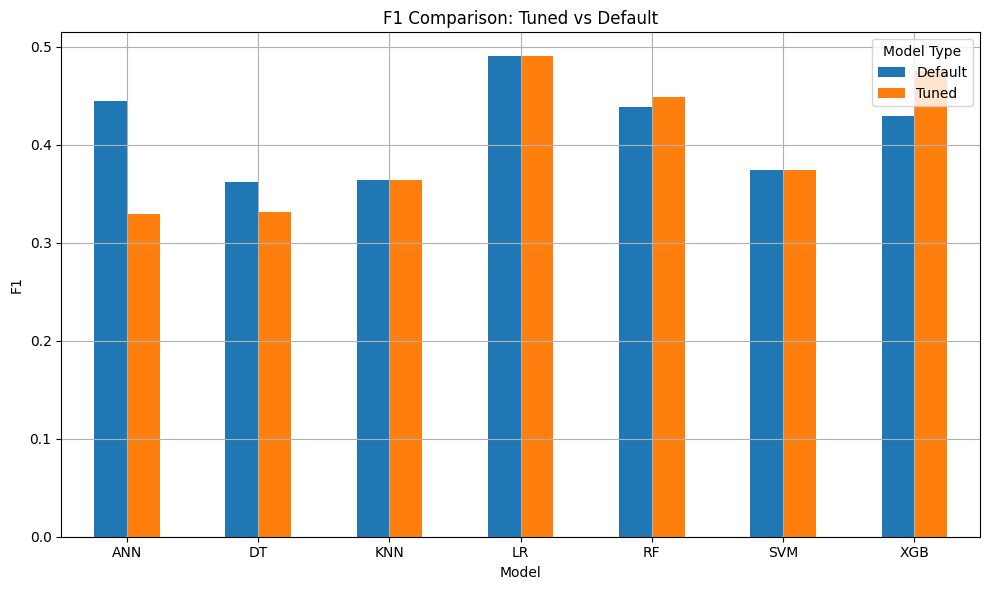

In [44]:
# 1. Prepare Data
X1 = df_final.select_dtypes(include=['int64', 'float64'])
y1 = df_final['Bankrupt?'].astype(int)

# 2. Scale
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X1)

# 3. Applying SelectKBest with ANOVA F-test
selector = SelectKBest(score_func=f_classif, k=20)
X_selected = selector.fit_transform(X1, y1)

# 4. Split
X_train, X_test, y_train, y_test = train_test_split(
    X_selected, y1, test_size=0.2, random_state=42, stratify=y1
)

# 5. SMOTE
smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X_train, y_train)

# 6. Compute scale_pos_weight for XGB
neg, pos = np.bincount(y_res)
scale_pos_weight = neg / pos

# 7. Define model sets
models_tuned = {
    'LR': LogisticRegression(C=1, solver='liblinear', max_iter=1000),
    'XGB': XGBClassifier(n_estimators=100, max_depth=3, learning_rate=0.1,
                         scale_pos_weight=scale_pos_weight, eval_metric='logloss'),
    'SVM': SVC(C=1, kernel='rbf', probability=True),
    'KNN': KNeighborsClassifier(n_neighbors=5),
    'RF': RandomForestClassifier(n_estimators=100, max_depth=None),
    'DT': DecisionTreeClassifier(),
    'ANN': MLPClassifier(hidden_layer_sizes=(100,), activation='relu',
                         alpha=1e-4, max_iter=500)
}

models_default = {
    'LR': LogisticRegression(),
    'XGB': XGBClassifier(),
    'SVM': SVC(probability=True),
    'KNN': KNeighborsClassifier(),
    'RF': RandomForestClassifier(),
    'DT': DecisionTreeClassifier(),
    'ANN': MLPClassifier(max_iter=300)
}

# 8. Evaluation Function
def evaluate_models(models_dict, label):
    scores = []
    for name, model in models_dict.items():
        model.fit(X_res, y_res)
        prob = model.predict_proba(X_test)[:,1]
        prec, rec, th = precision_recall_curve(y_test, prob)
        f1s = 2*prec*rec / (prec+rec+1e-8)
        idx = np.argmax(f1s[:-1])
        thresh = th[idx]
        preds = (prob >= thresh).astype(int)
        acc = accuracy_score(y_test, preds)
        print(f"\n--- {label} {name} (th={thresh:.3f}) ---")
        print(f"Accuracy: {acc:.2%},  F1: {f1s[idx]:.3f}")
        print(classification_report(y_test, preds))
        scores.append((name, label, acc, f1s[idx]))
    return scores

# 9. Run evaluations
scores_tuned = evaluate_models(models_tuned, 'Tuned')
scores_default = evaluate_models(models_default, 'Default')

# 10. Combine results
df_scores = pd.DataFrame(scores_tuned + scores_default,
                         columns=['Model', 'Type', 'Accuracy', 'F1'])

# 11. Plot Accuracy and F1 Score
for metric in ['Accuracy', 'F1']:
    df_plot = df_scores.pivot(index='Model', columns='Type', values=metric)
    ax = df_plot.plot(kind='bar', figsize=(10, 6), title=f'{metric} Comparison: Tuned vs Default')
    ax.set_ylabel(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
    ax.legend(title='Model Type')
    ax.grid(True)
    plt.tight_layout()
    plt.show()

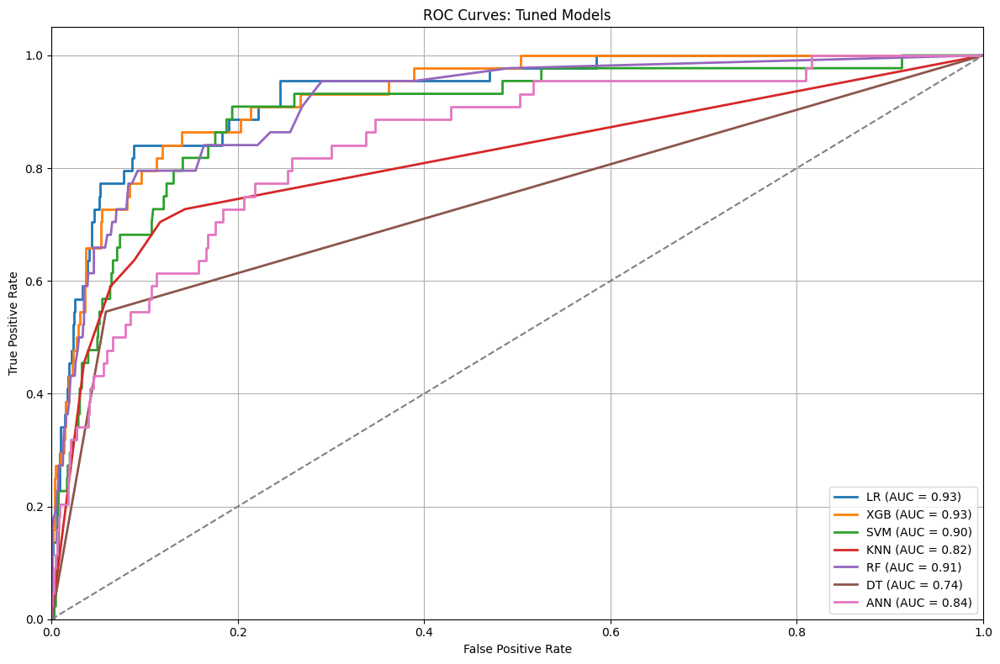

In [45]:
# Plot ROC Curves
plt.figure(figsize=(12, 8))
for name, model in models_tuned.items():
    # Predict probabilities
    probas = model.predict_proba(X_test)[:, 1]

    # Compute ROC curve and AUC
    fpr, tpr, _ = roc_curve(y_test, probas)
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {roc_auc:.2f})')

# Diagonal line for random classifier
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')

# Plot settings
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves: Tuned Models')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

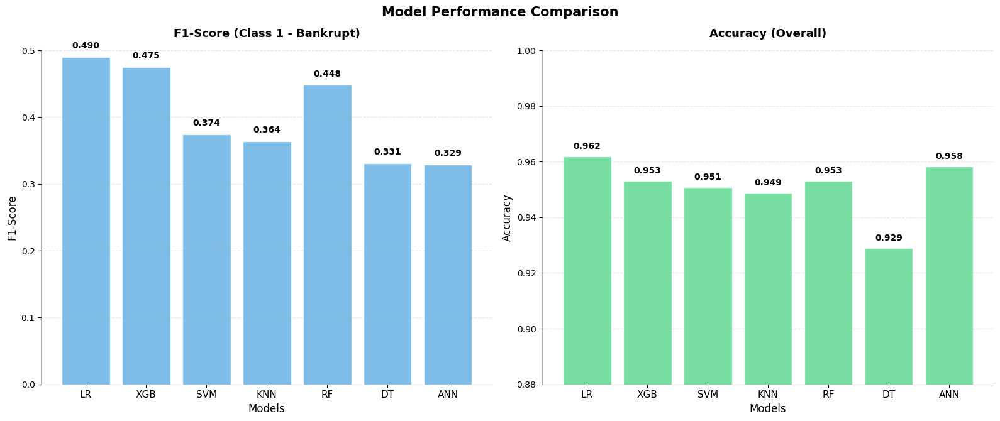

Model Performance Summary (Tuned Models):
Model  F1-Score   Accuracy  
---------------------------------------------
LR     0.490      0.962     
XGB    0.475      0.953     
SVM    0.374      0.951     
KNN    0.364      0.949     
RF     0.448      0.953     
DT     0.331      0.929     
ANN    0.329      0.958     

Best F1-Score: LR (0.490)
Best Accuracy: LR (0.962)


In [47]:
import matplotlib.pyplot as plt
import numpy as np

# Data from tuned models
models = ['LR', 'XGB', 'SVM', 'KNN', 'RF', 'DT', 'ANN']
f1_scores = [0.490, 0.475, 0.374, 0.364, 0.448, 0.331, 0.329]
accuracies = [0.9619, 0.9531, 0.9509, 0.9487, 0.9531, 0.9289, 0.9582]

# Create figure with subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))

# Color schemes
f1_color = '#5DADE2'  # Light blue
accuracy_color = '#58D68D'  # Light green

# Plot F1-Score (Class 1 - Bankrupt)
bars1 = ax1.bar(models, f1_scores, color=f1_color, alpha=0.8, edgecolor='white', linewidth=1)
ax1.set_title('F1-Score (Class 1 - Bankrupt)', fontsize=13, fontweight='bold', pad=15)
ax1.set_ylabel('F1-Score', fontsize=12)
ax1.set_ylim(0, 0.5)
ax1.grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels on bars
for bar, value in zip(bars1, f1_scores):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height + 0.01,
             f'{value:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

# Plot Accuracy (Overall)
bars2 = ax2.bar(models, accuracies, color=accuracy_color, alpha=0.8, edgecolor='white', linewidth=1)
ax2.set_title('Accuracy (Overall)', fontsize=13, fontweight='bold', pad=15)
ax2.set_ylabel('Accuracy', fontsize=12)
ax2.set_ylim(0.88, 1.0)
ax2.grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels on bars
for bar, value in zip(bars2, accuracies):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + 0.002,
             f'{value:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

# Styling
for ax in [ax1, ax2]:
    ax.set_xlabel('Models', fontsize=12)
    ax.tick_params(axis='x', labelsize=11)
    ax.tick_params(axis='y', labelsize=10)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_alpha(0.3)
    ax.spines['bottom'].set_alpha(0.3)

# Add main title
fig.suptitle('Model Performance Comparison', fontsize=15, fontweight='bold', y=0.95)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)
plt.show()

# Print summary table
print("Model Performance Summary (Tuned Models):")
print("=" * 45)
print(f"{'Model':<6} {'F1-Score':<10} {'Accuracy':<10}")
print("-" * 45)
for model, f1, acc in zip(models, f1_scores, accuracies):
    print(f"{model:<6} {f1:<10.3f} {acc:<10.3f}")

print(f"\nBest F1-Score: {models[np.argmax(f1_scores)]} ({max(f1_scores):.3f})")
print(f"Best Accuracy: {models[np.argmax(accuracies)]} ({max(accuracies):.3f})")